In [9]:
!pip install --force-reinstall "numpy==1.26.4"

  Using cached numpy-1.26.4-cp310-cp310-win_amd64.whl.metadata (61 kB)
Using cached numpy-1.26.4-cp310-cp310-win_amd64.whl (15.8 MB)
  Attempting uninstall: numpy
    Found existing installation: numpy 2.2.6
    Uninstalling numpy-2.2.6:
      Successfully uninstalled numpy-2.2.6


  You can safely remove it manually.
  You can safely remove it manually.


In [2]:
import sys
print(f"Python : {sys.version.split()[0]}")

import torch
print(f"PyTorch : {torch.__version__}")
print(f"CUDA dispo : {torch.cuda.is_available()}")
if torch.cuda.is_available():
    print(f"GPU : {torch.cuda.get_device_name(0)}")
    print(f"VRAM totale : {torch.cuda.get_device_properties(0).total_memory / 1e9:.1f} Go")

import mmseg, mmcv, mmengine
print(f"mmsegmentation : {mmseg.__version__}")
print(f"mmcv           : {mmcv.__version__}")
print(f"mmengine       : {mmengine.__version__}")

Python : 3.10.20
PyTorch : 2.1.0+cu118
CUDA dispo : True
GPU : NVIDIA GeForce RTX 2060
VRAM totale : 6.4 Go
mmsegmentation : 1.2.2
mmcv           : 2.1.0
mmengine       : 0.10.7


## Configuration des chemins

In [3]:
from pathlib import Path

PROJECT_ROOT = Path("..").resolve()
CHECKPOINTS_DIR = PROJECT_ROOT / "checkpoints"
IMAGES_DIR = PROJECT_ROOT / "data" / "raw" / "dalby"
OUTPUT_DIR = PROJECT_ROOT / "data" / "outputs" / "benchmark"
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

print(f"Checkpoints : {CHECKPOINTS_DIR}")
print(f"Images      : {IMAGES_DIR}")
print(f"Outputs     : {OUTPUT_DIR}")


assert CHECKPOINTS_DIR.exists(), f"Pas de checkpoints. Lance : python scripts\\download_checkpoints.py"
assert IMAGES_DIR.exists(), f"Pas d'images. Lance : python scripts\\download_dalby.py"

n_imgs = len(list(IMAGES_DIR.glob("dalby_*.jpg")))
n_ckpts = len(list(CHECKPOINTS_DIR.glob("*.pth")))
print(f"\n{n_imgs} images Dalby disponibles")
print(f"{n_ckpts} checkpoints trouves")

Checkpoints : C:\Users\youss\Downloads\coolpath_local\checkpoints
Images      : C:\Users\youss\Downloads\coolpath_local\data\raw\dalby
Outputs     : C:\Users\youss\Downloads\coolpath_local\data\outputs\benchmark

11 images Dalby disponibles
3 checkpoints trouves


## Checkpoints

In [4]:
MODELS_CONFIG = {}
patterns = {
    "SegFormer-B5":      ("segformer_mit-b5_8xb1-160k_cityscapes-1024x1024", "segformer_mit-b5_*.pth"),
    "Mask2Former-SwinB": ("mask2former_swin-b-in22k-384x384-pre_8xb2-90k_cityscapes-512x1024", "mask2former_swin-b*.pth"),
    "DeepLabV3+-R101":   ("deeplabv3plus_r101-d8_4xb2-80k_cityscapes-512x1024", "deeplabv3plus_r101-d8_*.pth"),
}

for name, (config_basename, pth_pattern) in patterns.items():
    config_path = CHECKPOINTS_DIR / f"{config_basename}.py"
    pth_files = list(CHECKPOINTS_DIR.glob(pth_pattern))
    if pth_files and config_path.exists():
        MODELS_CONFIG[name] = {"config": config_path, "checkpoint": pth_files[0]}
        print(f"  {name:<25s} OK")
    else:
        print(f"  {name:<25s} MANQUANT")
        print(f"    config : {config_path.exists()}")
        print(f"    pth    : {len(pth_files)} fichier(s)")

print(f"\n{len(MODELS_CONFIG)}/{len(patterns)} modeles prets.")

  SegFormer-B5              OK
  Mask2Former-SwinB         OK
  DeepLabV3+-R101           OK

3/3 modeles prets.


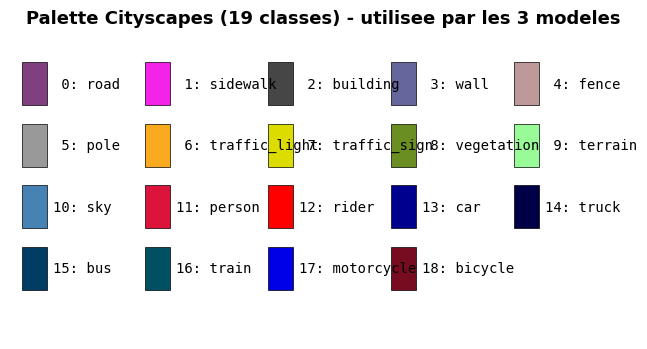

In [5]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle


CITYSCAPES_PALETTE = np.array([
    [128,  64, 128], [244,  35, 232], [ 70,  70,  70], [102, 102, 156], [190, 153, 153],
    [153, 153, 153], [250, 170,  30], [220, 220,   0], [107, 142,  35], [152, 251, 152],
    [ 70, 130, 180], [220,  20,  60], [255,   0,   0], [  0,   0, 142], [  0,   0,  70],
    [  0,  60, 100], [  0,  80, 100], [  0,   0, 230], [119,  11,  32],
], dtype=np.uint8)

CITYSCAPES_LABELS = [
    "road", "sidewalk", "building", "wall", "fence", "pole", "traffic_light",
    "traffic_sign", "vegetation", "terrain", "sky", "person", "rider",
    "car", "truck", "bus", "train", "motorcycle", "bicycle",
]


def show_palette(palette, labels, title, ncols=5):
    n = len(palette)
    nrows = (n + ncols - 1) // ncols
    fig, ax = plt.subplots(figsize=(ncols * 2.4, nrows * 0.9))
    for i, (color, label) in enumerate(zip(palette, labels)):
        row, col = i // ncols, i % ncols
        rect = Rectangle((col * 2, -row), 0.4, 0.7, color=color / 255, ec="black", lw=0.5)
        ax.add_patch(rect)
        ax.text(col * 2 + 0.5, -row + 0.35, f"{i:>2}: {label}",
                va="center", ha="left", fontsize=10, family="monospace")
    ax.set_xlim(-0.2, ncols * 2)
    ax.set_ylim(-nrows + 0.2, 1)
    ax.set_aspect("equal")
    ax.axis("off")
    ax.set_title(title, fontweight="bold", fontsize=13, pad=15)
    plt.tight_layout()
    plt.show()


show_palette(CITYSCAPES_PALETTE, CITYSCAPES_LABELS,
             "Palette Cityscapes (19 classes) - utilisee par les 3 modeles", ncols=5)

## Fonctions 

In [6]:
!pip install ftfy regex

In [6]:
from mmseg.apis import init_model, inference_model
from PIL import Image
import time


def colorize(mask):
    return CITYSCAPES_PALETTE[np.clip(mask, 0, 18)]


def overlay(image, mask, alpha=0.55):
    color = colorize(mask)
    img_arr = np.array(image.convert("RGB"))
    return ((1 - alpha) * img_arr + alpha * color).astype(np.uint8)


def run_model(config_path, checkpoint_path, image_paths):
    """Charge un modele MMSeg, l'execute sur toutes les images, libere la VRAM."""
    model = init_model(str(config_path), str(checkpoint_path), device="cuda:0")
    masks = {}
    times = {}

    if image_paths:
        _ = inference_model(model, str(image_paths[0]))

    for img_path in image_paths:
        torch.cuda.synchronize()
        t0 = time.perf_counter()
        result = inference_model(model, str(img_path))
        torch.cuda.synchronize()
        elapsed = time.perf_counter() - t0

        mask = result.pred_sem_seg.data[0].cpu().numpy().astype(np.int32)
        masks[img_path.name] = mask
        times[img_path.name] = elapsed


    del model
    torch.cuda.empty_cache()

    return masks, times

## Test

In [7]:
image_files = sorted(IMAGES_DIR.glob("dalby_*.jpg"))
print(f"Traitement de {len(image_files)} images avec {len(MODELS_CONFIG)} modeles...\n")

all_masks = {} 
all_times = {}

for model_name, cfg in MODELS_CONFIG.items():
    print(f"=== {model_name} ===")
    masks, times = run_model(cfg["config"], cfg["checkpoint"], image_files)
    all_masks[model_name] = masks
    all_times[model_name] = times

    avg_time = sum(times.values()) / len(times)
    print(f"  Temps moyen : {avg_time*1000:.1f} ms/image  ({1/avg_time:.1f} FPS)\n")

print("Benchmark termine.")

Traitement de 11 images avec 3 modeles...

=== SegFormer-B5 ===


C:\Users\youss\miniconda3\envs\coolpath\lib\site-packages\mmseg\models\builder.py:36: UserWarning: ``build_loss`` would be deprecated soon, please use ``mmseg.registry.MODELS.build()`` 
  warnings.warn('``build_loss`` would be deprecated soon, please use '
C:\Users\youss\miniconda3\envs\coolpath\lib\site-packages\mmseg\models\losses\cross_entropy_loss.py:250: UserWarning: Default ``avg_non_ignore`` is False, if you would like to ignore the certain label and average loss over non-ignore labels, which is the same with PyTorch official cross_entropy, set ``avg_non_ignore=True``.
  warnings.warn(


Loads checkpoint by local backend from path: C:\Users\youss\Downloads\coolpath_local\checkpoints\segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth
  Temps moyen : 924.6 ms/image  (1.1 FPS)

=== Mask2Former-SwinB ===
Loads checkpoint by local backend from path: C:\Users\youss\Downloads\coolpath_local\checkpoints\mask2former_swin-b-in22k-384x384-pre_8xb2-90k_cityscapes-512x1024_20221203_045030-9a86a225.pth


C:\Users\youss\miniconda3\envs\coolpath\lib\site-packages\torch\functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ..\aten\src\ATen\native\TensorShape.cpp:3527.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


  Temps moyen : 782.1 ms/image  (1.3 FPS)

=== DeepLabV3+-R101 ===
Loads checkpoint by local backend from path: C:\Users\youss\Downloads\coolpath_local\checkpoints\deeplabv3plus_r101-d8_512x1024_80k_cityscapes_20200606_114143-068fcfe9.pth
  Temps moyen : 831.1 ms/image  (1.2 FPS)

Benchmark termine.


## Visualisation :



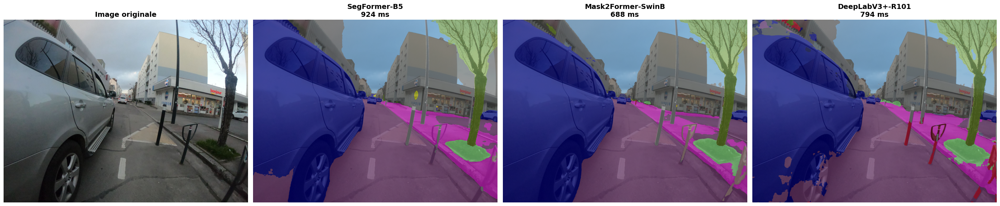

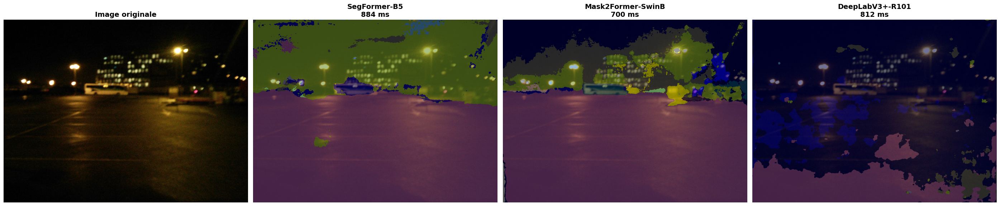

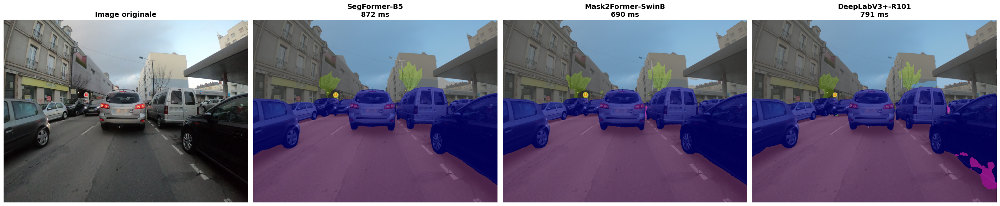

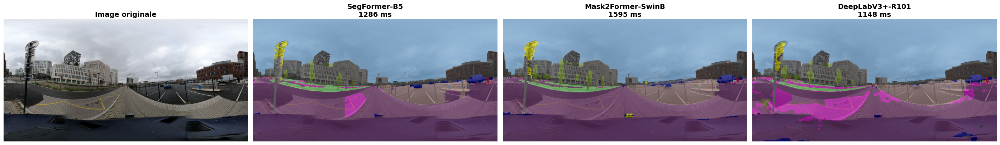

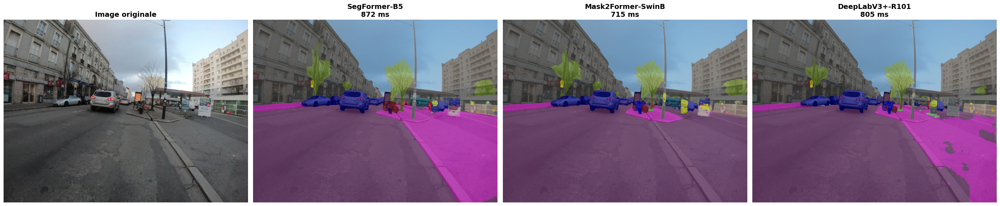

...

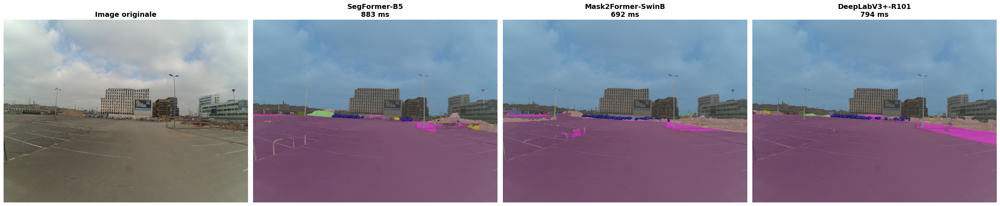

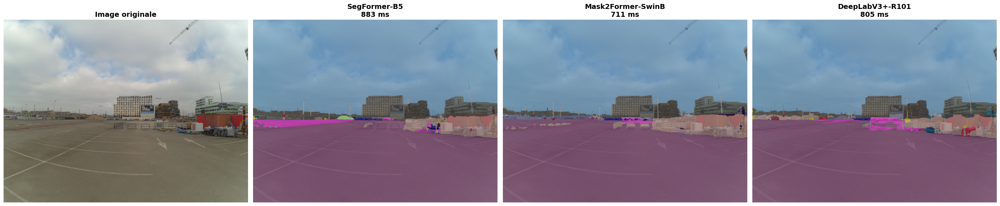

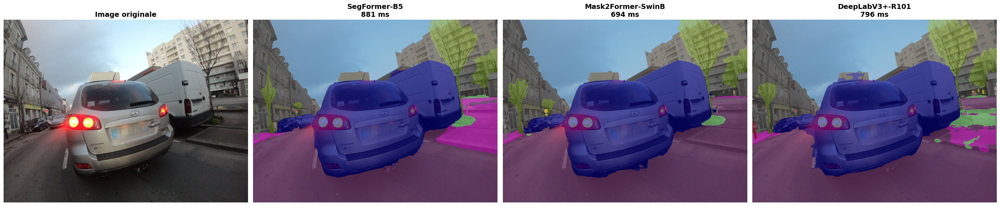

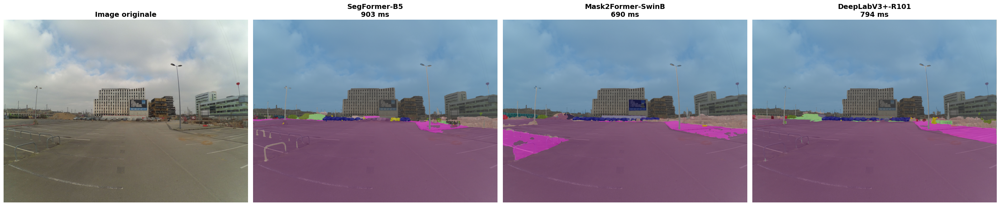

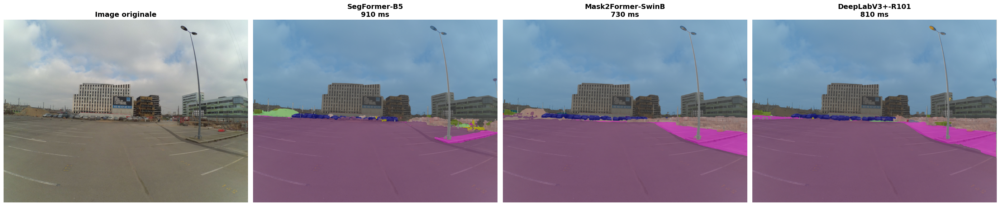

11 comparaisons sauvegardees dans C:\Users\youss\Downloads\coolpath_local\data\outputs\benchmark


In [8]:
for img_path in image_files:
    image = Image.open(img_path).convert("RGB")

    fig, axes = plt.subplots(1, 4, figsize=(28, 7))

    axes[0].imshow(image)
    axes[0].set_title("Image originale", fontweight="bold", fontsize=14)
    axes[0].axis("off")

    for ax, model_name in zip(axes[1:], MODELS_CONFIG.keys()):
        mask = all_masks[model_name][img_path.name]
        t_ms = all_times[model_name][img_path.name] * 1000
        ax.imshow(overlay(image, mask))
        ax.set_title(f"{model_name}\n{t_ms:.0f} ms",
                     fontweight="bold", fontsize=14)
        ax.axis("off")

    plt.tight_layout()
    out_path = OUTPUT_DIR / f"comparison_{img_path.stem}.png"
    plt.savefig(out_path, dpi=110, bbox_inches="tight")
    plt.show()
    plt.close()

print(f"{len(image_files)} comparaisons sauvegardees dans {OUTPUT_DIR}")

## Tableau récapitulatif

In [9]:
import pandas as pd

rows = []
for model_name, times in all_times.items():
    for img_name, t in times.items():
        rows.append({
            "model": model_name,
            "image": img_name,
            "time_ms": t * 1000,
            "fps": 1.0 / t,
        })
df = pd.DataFrame(rows)

# Resume par modele
summary = df.groupby("model").agg(
    time_mean_ms=("time_ms", "mean"),
    time_std_ms=("time_ms", "std"),
    fps_mean=("fps", "mean"),
).round(2)

# Sauvegarde
df.to_csv(OUTPUT_DIR / "benchmark_detailed.csv", index=False)
summary.to_csv(OUTPUT_DIR / "benchmark_summary.csv")

print("Resume par modele :")
summary

Resume par modele :


,time_mean_ms,time_std_ms,fps_mean
model,,,
DeepLabV3+-R101,831.13,105.29,1.22
Mask2Former-SwinB,782.05,269.94,1.35
SegFormer-B5,924.59,120.92,1.09
